In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import os 
import sys

sys.path.append('../../boxcox')
sys.path.append('../../comparison')
sys.path.append('../../dCor')
sys.path.append('../../local_maximal_corr')
sys.path.append('../../MCI')

from img_comparison import compare_images

from scipy.spatial import distance
from main_lmc import LocalMaximalCorr
from minepy import MINE
import dcor 

from scipy.stats import pearsonr

In [22]:
def get_all_comp(img_1, img_2, method = 'full'):

    comp = compare_images(img_1, img_2)

    # dcor
    dcorr_func = lambda x, y: dcor.distance_correlation(x, y)
    dcor_res = comp.compare_images(function=dcorr_func, comparison_method= method)

    dcov_func = lambda x, y: dcor.distance_covariance(x, y)
    dcov_res = comp.compare_images(function=dcov_func, comparison_method= method)

    # # lmc
    # lmc = lambda x, y: LocalMaximalCorr(x, y).local_maximal_corr()[0]
    # lmc_res = comp.compare_images(function=lmc, comparison_method= method)

    # mic
    def mic(x, y):
        m = MINE(alpha=0.6, c=15, est="mic_e")
        m.compute_score(x, y)
        return m.mic()
    
    mic_e = lambda x, y:  mic(x, y)
    mic_e_res = comp.compare_images(function=mic_e, comparison_method= method)

    # tic
    def tic(x, y):
        m = MINE(alpha=0.6, c=15, est="mic_e")
        m.compute_score(x, y)
        return m.tic()
    tic_e = lambda x, y:  tic(x, y)
    tic_e_res = comp.compare_images(function=tic_e, comparison_method= method)


    # corr
    corr = lambda x, y: pearsonr(x, y)[0]
    corr_res = comp.compare_images(function=corr, comparison_method= method)

    return dcor_res,dcov_res , mic_e_res, tic_e_res, corr_res


    

In [23]:
images_df_full = pd.DataFrame(columns=['n_image', 'lambda','dcor', 'dcov' ,  'mic', 'tic', 'pearson'])

images_df_hist = pd.DataFrame(columns=['n_image', 'lambda','dcor', 'dcov' ,  'mic', 'tic', 'pearson'])


In [24]:
from box_cox_img import BoxCoxImg
import matplotlib.pyplot as plt

from tqdm import tqdm

# for i in tqdm(range(1, 23)):
#     img_path = f'../../boxcox/img/{i}.png'
    
#     BCI = BoxCoxImg(img_path)
#     # plt.imshow(BCI.bw_img, cmap='gray')
#     # plt.show()

#     for lmbda in np.linspace(-5, 5, 31):

#         #full
#         full_bc = BCI.transform(method='full', lam= lmbda)
#         # plt.imshow(full_bc, cmap='gray')
#         # plt.show()

#         plt.show()

#         dcor_full_full, dcov_full_full ,mic_full_full, tic_full_full, corr_full_full = get_all_comp(BCI.bw_img, full_bc, method='full')
#         print(f'full bc, full comp: dcor={dcor_full_full}, dcov={dcov_full_full}, mic={mic_full_full}, tic={tic_full_full}, corr={corr_full_full}')

#         dcor_hist_full, dcov_hist_full ,mic_hist_full, tic_hist_full, corr_hist_full = get_all_comp(BCI.bw_img, full_bc, method='hist')
#         print(f'full bc, hist comp: dcor={dcor_hist_full}, dcov={dcov_hist_full}, mic={mic_hist_full}, tic={tic_hist_full}, corr={corr_hist_full}')

#         images_df_full = pd.concat([images_df_full, pd.DataFrame([[i, lmbda, dcor_full_full, dcov_full_full, mic_full_full, tic_full_full, corr_full_full]]
#                                                                 , columns=images_df_full.columns)], ignore_index=True)
                                                                


#         images_df_hist = pd.concat([images_df_hist, pd.DataFrame([[i, lmbda, dcor_hist_full, dcov_hist_full, mic_hist_full, tic_hist_full, corr_hist_full]]
#                                                                 , columns=images_df_hist.columns)], ignore_index=True)
        
#     #     break
#     images_df_full.to_csv('./images_lam_df_full.csv')
#     images_df_hist.to_csv('./images_lam_df_hist.csv')
#     # break


# images_df_full.to_csv('./images_lam_df_full_end.csv')
# images_df_hist.to_csv('./images_lam_df_hist_end.csv')


images_df_full = pd.read_csv('./images_lam_df_full_end.csv', index_col=0)
images_df_hist = pd.read_csv('./images_lam_df_hist_end.csv', index_col=0)

  0%|          | 0/22 [00:00<?, ?it/s]/home/fcastellano/.conda/envs/memoria/lib/python3.10/site-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float32, 1d, C), array(float32, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(


full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26047477087516, corr=0.12126326192518727
full bc, hist comp: dcor=0.05801604522079911, dcov=107.20537725900765, mic=0.033981292997902125, tic=0.6649053082584396, corr=-0.03828203209267847


/home/fcastellano/.conda/envs/memoria/lib/python3.10/site-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(int64, 1d, C), array(int64, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(
/tmp/ipykernel_80341/599046459.py:28: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  images_df_full = pd.concat([images_df_full, pd.DataFrame([[i, lmbda, dcor_full_full, dcov_full_full, mic_full_full, tic_full_full, corr_full_full]]
/tmp/ipykernel_80341/599046459.py:33: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA ent

full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26047477087516, corr=0.12126326192518727
full bc, hist comp: dcor=0.05801604522079911, dcov=107.20537725900765, mic=0.033981292997902125, tic=0.6649053082584396, corr=-0.03828203209267847
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26047477087516, corr=0.12126326192518727
full bc, hist comp: dcor=0.05801604522079911, dcov=107.20537725900765, mic=0.033981292997902125, tic=0.6649053082584396, corr=-0.03828203209267847
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26047477087516, corr=0.12126326192518727
full bc, hist comp: dcor=0.05801604522079911, dcov=107.20537725900765, mic=0.033981292997902125, tic=0.6649053082584396, corr=-0.03828203209267847
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26047477087516, corr=0.12126326192518727
full bc, hist comp: dcor=0.05801604522079911, dcov=107.20537725900765, mic=0.033981292997902125, ti

  5%|▍         | 1/22 [53:41<18:47:28, 3221.34s/it]

full bc, full comp: dcor=0.9240821072543721, dcov=0.050610223666854, mic=0.9999999932711469, tic=13346.369527116707, corr=0.7274419363173378
full bc, hist comp: dcor=0.30820956001728883, dcov=424.7028104705347, mic=0.37749804587096436, tic=9.973180749083372, corr=-0.14033585694419737
full bc, full comp: dcor=0.16452482520735792, dcov=0.0018332936710026397, mic=0.020393135236083576, tic=186.25965363230094, corr=0.17057910953780192
full bc, hist comp: dcor=0.0343067739429946, dcov=75.01761525236697, mic=0.03460162379961953, tic=0.7056682044922881, corr=-0.020199363420661372
full bc, full comp: dcor=0.16452482520735792, dcov=0.0018332936710026397, mic=0.020393135236083576, tic=186.25965363230094, corr=0.17057910953780192
full bc, hist comp: dcor=0.0343067739429946, dcov=75.01761525236697, mic=0.03460162379961953, tic=0.7056682044922881, corr=-0.020199363420661372
full bc, full comp: dcor=0.16452482520735792, dcov=0.0018332936710026397, mic=0.020393135236083576, tic=186.25965363230094, cor

  9%|▉         | 2/22 [1:45:40<17:33:47, 3161.36s/it]

full bc, full comp: dcor=0.7195110734347845, dcov=0.010508566160870392, mic=0.9999999995231517, tic=13350.617799177093, corr=0.675597529523371
full bc, hist comp: dcor=0.053259670444209546, dcov=105.23361625980189, mic=0.2945676803324132, tic=9.37141891509846, corr=-0.015185343935606232
full bc, full comp: dcor=0.06607142225674913, dcov=0.0012898732845580084, mic=0.020393135236083576, tic=186.26137546650293, corr=0.11428947061051595
full bc, hist comp: dcor=0.06496486227047873, dcov=121.63380400656406, mic=0.0320523647599259, tic=0.6661253220522799, corr=-0.05277870701268142
full bc, full comp: dcor=0.06607142225674913, dcov=0.0012898732845580084, mic=0.020393135236083576, tic=186.26137546650293, corr=0.11428947061051595
full bc, hist comp: dcor=0.06496486227047873, dcov=121.63380400656406, mic=0.0320523647599259, tic=0.6661253220522799, corr=-0.05277870701268142
full bc, full comp: dcor=0.06607142225674913, dcov=0.0012898732845580084, mic=0.020393135236083576, tic=186.26137546650293, 

 14%|█▎        | 3/22 [3:01:17<20:00:01, 3789.53s/it]

full bc, full comp: dcor=0.8530455935660131, dcov=0.04495534623895487, mic=0.9999999873849528, tic=13347.686510965757, corr=0.7376988701384085
full bc, hist comp: dcor=0.22180130513974342, dcov=312.89546950823666, mic=0.6037292767011778, tic=16.147472107016533, corr=-0.10433324064360502
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26246585437354, corr=0.114117305376814
full bc, hist comp: dcor=0.062114530028015494, dcov=119.16474821818379, mic=0.02988944014469223, tic=0.6288074145959165, corr=-0.05545924068566456
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26246585437354, corr=0.114117305376814
full bc, hist comp: dcor=0.062114530028015494, dcov=119.16474821818379, mic=0.02988944014469223, tic=0.6288074145959165, corr=-0.05545924068566456
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26246585437354, corr=0.114117305376814
full bc, hist comp: dcor=0.062114530028015494, dcov=119.16474821818379, mic=0.0

 18%|█▊        | 4/22 [3:52:11<17:29:46, 3499.24s/it]

full bc, full comp: dcor=0.8869398545618163, dcov=0.040814151514426446, mic=0.9999999845675271, tic=13345.604401698167, corr=0.7092056256508128
full bc, hist comp: dcor=0.21705903766407073, dcov=315.52389314767686, mic=0.3598086720025586, tic=10.241597233562569, corr=-0.09371197881439403
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.27125132423012, corr=0.07542924437634331
full bc, hist comp: dcor=0.06513217094916607, dcov=114.77904037064462, mic=0.03026908931065065, tic=0.6349399191783726, corr=-0.05666390337790718
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.27125132423012, corr=0.07542924437634331
full bc, hist comp: dcor=0.06513217094916607, dcov=114.77904037064462, mic=0.03026908931065065, tic=0.6349399191783726, corr=-0.05666390337790718
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.27125132423012, corr=0.07542924437634331
full bc, hist comp: dcor=0.06513217094916607, dcov=114.77904037064462, mic

 23%|██▎       | 5/22 [4:44:33<15:54:56, 3370.40s/it]

full bc, full comp: dcor=0.7689150757072235, dcov=0.051427903174649924, mic=0.9999999999813383, tic=13344.631938180439, corr=0.7115970896670734
full bc, hist comp: dcor=0.15070294984427332, dcov=212.82078056842192, mic=0.4676267739788893, tic=11.720578702457574, corr=-0.046944531357986374
full bc, full comp: dcor=0.06300131974984474, dcov=0.0016094240421324704, mic=0.020393135236083576, tic=186.25970186947788, corr=0.09855957604244943
full bc, hist comp: dcor=0.08004478285384814, dcov=124.42782916163128, mic=0.030694178431361466, tic=0.6549234809379331, corr=-0.0582104927187719
full bc, full comp: dcor=0.06300131974984474, dcov=0.0016094240421324704, mic=0.020393135236083576, tic=186.25970186947788, corr=0.09855957604244943
full bc, hist comp: dcor=0.08004478285384814, dcov=124.42782916163128, mic=0.030694178431361466, tic=0.6549234809379331, corr=-0.0582104927187719
full bc, full comp: dcor=0.06300131974984474, dcov=0.0016094240421324704, mic=0.020393135236083576, tic=186.259701869477

 27%|██▋       | 6/22 [5:34:48<14:26:28, 3249.31s/it]

full bc, full comp: dcor=0.9097692914029935, dcov=0.15440425395933216, mic=0.9999999999823387, tic=13345.906967208184, corr=0.8752364148006619
full bc, hist comp: dcor=0.35603134023910515, dcov=357.7421851860105, mic=0.3331258478664939, tic=10.181839271094912, corr=-0.14275664601176938
full bc, full comp: dcor=0.05846632295571708, dcov=0.0011290893965074452, mic=0.020393135236083576, tic=186.2651803894196, corr=0.13115577158685
full bc, hist comp: dcor=0.06441503901343713, dcov=119.37259348895242, mic=0.033216106473007434, tic=0.6922060931606864, corr=-0.04971774759319458
full bc, full comp: dcor=0.05846632295571708, dcov=0.0011290893965074452, mic=0.020393135236083576, tic=186.2651803894196, corr=0.13115577158685
full bc, hist comp: dcor=0.06441503901343713, dcov=119.37259348895242, mic=0.033216106473007434, tic=0.6922060931606864, corr=-0.04971774759319458
full bc, full comp: dcor=0.05846632295571708, dcov=0.0011290893965074452, mic=0.020393135236083576, tic=186.2651803894196, corr=0

 32%|███▏      | 7/22 [6:26:05<13:18:16, 3193.09s/it]

full bc, full comp: dcor=0.9069031501611696, dcov=0.04031485683612438, mic=0.9999997312770903, tic=13347.895486135523, corr=0.7132549880064464
full bc, hist comp: dcor=0.26273730623838576, dcov=375.67538240324365, mic=0.6530465905606887, tic=18.873502140760074, corr=-0.13291817610562595
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26026122334733, corr=0.08567887300542729
full bc, hist comp: dcor=0.26052172077313906, dcov=385.97333494423094, mic=0.046516502636305745, tic=0.9495330766635434, corr=0.36945870422080584
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26026122334733, corr=0.08567887300542729
full bc, hist comp: dcor=0.26052172077313906, dcov=385.97333494423094, mic=0.046516502636305745, tic=0.9495330766635434, corr=0.36945870422080584
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.26026122334733, corr=0.08567887300542729
full bc, hist comp: dcor=0.26052172077313906, dcov=385.97333494423094, mic=

 36%|███▋      | 8/22 [7:17:46<12:18:14, 3163.91s/it]

full bc, full comp: dcor=0.9047745469841656, dcov=0.1472165449325408, mic=0.9999999998320471, tic=13345.546045543713, corr=0.8587991068437513
full bc, hist comp: dcor=0.27314443214942963, dcov=274.1710611157955, mic=0.2819422129544269, tic=7.306673763539687, corr=-0.11059144474185262
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2602545717356, corr=0.15292486257806645
full bc, hist comp: dcor=0.061721311807072805, dcov=115.59309826347723, mic=0.03017030932798083, tic=0.6403517923474905, corr=-0.048360145937762236
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2602545717356, corr=0.15292486257806645
full bc, hist comp: dcor=0.061721311807072805, dcov=115.59309826347723, mic=0.03017030932798083, tic=0.6403517923474905, corr=-0.048360145937762236
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2602545717356, corr=0.15292486257806645
full bc, hist comp: dcor=0.061721311807072805, dcov=115.59309826347723, mic=0

 41%|████      | 9/22 [8:08:37<11:17:50, 3128.51s/it]

full bc, full comp: dcor=0.906051583572602, dcov=0.055758234896213996, mic=0.9999999999813382, tic=13347.433833600988, corr=0.7756137910474782
full bc, hist comp: dcor=0.33986490280276926, dcov=492.4186624251511, mic=0.36004246654947025, tic=10.12586368725386, corr=-0.22753758168103394
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.27915750099768, corr=0.13610800726946837
full bc, hist comp: dcor=0.05706280820920319, dcov=105.28342532647599, mic=0.030583047152620738, tic=0.6221599696475344, corr=-0.0033107824805087005
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.27915750099768, corr=0.13610800726946837
full bc, hist comp: dcor=0.05706280820920319, dcov=105.28342532647599, mic=0.030583047152620738, tic=0.6221599696475344, corr=-0.0033107824805087005
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.27915750099768, corr=0.13610800726946837
full bc, hist comp: dcor=0.05706280820920319, dcov=105.28342532647599,

 45%|████▌     | 10/22 [8:59:13<10:19:59, 3099.94s/it]

full bc, full comp: dcor=0.8891689069500535, dcov=0.05567430285487525, mic=0.9999999993281916, tic=13346.036780462733, corr=0.7343878102403963
full bc, hist comp: dcor=0.28379035204092035, dcov=398.5964029756011, mic=0.3087014676567423, tic=8.64180174137714, corr=-0.18367541517753438
full bc, full comp: dcor=0.02643859986862685, dcov=0.0005515442575694501, mic=0.020393135236083576, tic=186.50494281530274, corr=0.09870354712262679
full bc, hist comp: dcor=0.06022329365107255, dcov=112.33378589144667, mic=0.0346016237996195, tic=0.7176965800361476, corr=-0.041195805861092345
full bc, full comp: dcor=0.02643859986862685, dcov=0.0005515442575694501, mic=0.020393135236083576, tic=186.50494281530274, corr=0.09870354712262679
full bc, hist comp: dcor=0.06022329365107255, dcov=112.33378589144667, mic=0.0346016237996195, tic=0.7176965800361476, corr=-0.041195805861092345
full bc, full comp: dcor=0.02643859986862685, dcov=0.0005515442575694501, mic=0.020393135236083576, tic=186.50494281530274, c

 50%|█████     | 11/22 [9:49:48<9:24:39, 3079.98s/it] 

full bc, full comp: dcor=0.8343201429400345, dcov=0.03337219764300584, mic=0.9999999972448516, tic=13348.575916164105, corr=0.56838550510537
full bc, hist comp: dcor=0.16263193154936725, dcov=247.24739836738777, mic=0.4974117486190023, tic=13.801281847614787, corr=-0.0747092892141167
full bc, full comp: dcor=0.018642400682568047, dcov=0.0003840619207903531, mic=0.020393135236083576, tic=186.26053992351538, corr=0.15649275179786962
full bc, hist comp: dcor=0.05931187989279504, dcov=110.31973252833876, mic=0.024700004879422262, tic=0.5854387754101569, corr=-0.04122009900871522
full bc, full comp: dcor=0.018642400682568047, dcov=0.0003840619207903531, mic=0.020393135236083576, tic=186.26053992351538, corr=0.15649275179786962
full bc, hist comp: dcor=0.05931187989279504, dcov=110.31973252833876, mic=0.024700004879422262, tic=0.5854387754101569, corr=-0.04122009900871522
full bc, full comp: dcor=0.018642400682568047, dcov=0.0003840619207903531, mic=0.020393135236083576, tic=186.260539923515

 55%|█████▍    | 12/22 [10:40:30<8:31:25, 3068.52s/it]

full bc, full comp: dcor=0.8879404852286104, dcov=0.09403157804449946, mic=0.9999999997014181, tic=13347.457266153326, corr=0.7906114084357649
full bc, hist comp: dcor=0.40203198162217746, dcov=496.8992922283865, mic=0.40639987318721427, tic=12.977363246554042, corr=-0.21690159923912064
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2605351957133, corr=0.09024775346554416
full bc, hist comp: dcor=0.11303793495106211, dcov=190.9241855330738, mic=0.031050070469556587, tic=0.6465807707124518, corr=0.0903863778436312
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2605351957133, corr=0.09024775346554416
full bc, hist comp: dcor=0.11303793495106211, dcov=190.9241855330738, mic=0.031050070469556587, tic=0.6465807707124518, corr=0.0903863778436312
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2605351957133, corr=0.09024775346554416
full bc, hist comp: dcor=0.11303793495106211, dcov=190.9241855330738, mic=0.031050

 59%|█████▉    | 13/22 [11:31:47<7:40:39, 3071.09s/it]

full bc, full comp: dcor=0.8519635574221132, dcov=0.09162203170826223, mic=0.9999999984884314, tic=13345.48533361191, corr=0.8102096180321356
full bc, hist comp: dcor=0.22069290940799957, dcov=270.50358836455104, mic=0.333261773745522, tic=8.54197188067674, corr=-0.10519848232230336
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.27024171383556, corr=0.08772702452834762
full bc, hist comp: dcor=0.08142871768117019, dcov=133.13398696222885, mic=0.030808895814876367, tic=0.6609335404810699, corr=-0.07022051705104229
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.27024171383556, corr=0.08772702452834762
full bc, hist comp: dcor=0.08142871768117019, dcov=133.13398696222885, mic=0.030808895814876367, tic=0.6609335404810699, corr=-0.07022051705104229
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.27024171383556, corr=0.08772702452834762
full bc, hist comp: dcor=0.08142871768117019, dcov=133.13398696222885, mic=0.

 64%|██████▎   | 14/22 [12:23:47<6:51:25, 3085.72s/it]

full bc, full comp: dcor=0.8705017277011042, dcov=0.05530504729761508, mic=0.9999999819480409, tic=13345.544302840055, corr=0.7342063149548589
full bc, hist comp: dcor=0.20025753853800737, dcov=244.44429030268373, mic=0.4206002147310965, tic=11.035756382606722, corr=-0.08530595159329317
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.29645382100114, corr=0.05850112753005893
full bc, hist comp: dcor=0.15872701113007318, dcov=273.7249910766951, mic=0.046516502636305745, tic=0.9452041702406492, corr=0.17511002890856045
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.29645382100114, corr=0.05850112753005893
full bc, hist comp: dcor=0.15872701113007318, dcov=273.7249910766951, mic=0.046516502636305745, tic=0.9452041702406492, corr=0.17511002890856045
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.29645382100114, corr=0.05850112753005893
full bc, hist comp: dcor=0.15872701113007318, dcov=273.7249910766951, mic=0.0

 68%|██████▊   | 15/22 [13:14:04<5:57:35, 3065.11s/it]

full bc, full comp: dcor=0.9454148651504956, dcov=0.22513017643151068, mic=0.9999999998763721, tic=13344.32173593016, corr=0.9181159814874451
full bc, hist comp: dcor=0.14373529572863675, dcov=191.7595913291255, mic=0.2111439351165268, tic=5.3897626552295135, corr=-0.04867728527380674
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2651036457302, corr=0.10703667213142835
full bc, hist comp: dcor=0.06842020364359169, dcov=127.4561384377239, mic=0.03299373519415595, tic=0.6816445544719281, corr=-0.05931826976871465
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2651036457302, corr=0.10703667213142835
full bc, hist comp: dcor=0.06842020364359169, dcov=127.4561384377239, mic=0.03299373519415595, tic=0.6816445544719281, corr=-0.05931826976871465
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2651036457302, corr=0.10703667213142835
full bc, hist comp: dcor=0.06842020364359169, dcov=127.4561384377239, mic=0.032993

 73%|███████▎  | 16/22 [14:04:08<5:04:39, 3046.59s/it]

full bc, full comp: dcor=0.8160373731811676, dcov=0.05315206511664997, mic=0.9999999925354743, tic=13346.553988326887, corr=0.7384047796922425
full bc, hist comp: dcor=0.23797579600126756, dcov=332.3853653409734, mic=0.4292764376193584, tic=12.69934579818853, corr=-0.11739502731453755
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.0008350151913301536, tic=6.862814549554236, corr=0.011654087660224632
full bc, hist comp: dcor=0.07569726425382388, dcov=129.14944099949696, mic=0.03460162379961952, tic=0.7798481324565636, corr=-0.05790773716402674
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.0008350151913301536, tic=6.862814549554236, corr=0.011654087660224632
full bc, hist comp: dcor=0.07569726425382388, dcov=129.14944099949696, mic=0.03460162379961952, tic=0.7798481324565636, corr=-0.05790773716402674
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.0008350151913301536, tic=6.862814549554236, corr=0.011654087660224632
full bc, hist comp: dcor=0.07569726425382388, dcov=129.14944099949696, mic

 77%|███████▋  | 17/22 [14:54:09<4:12:44, 3032.98s/it]

full bc, full comp: dcor=0.832109094398375, dcov=0.04285378037014198, mic=0.9999999993281916, tic=13336.944219404451, corr=0.6670594405835376
full bc, hist comp: dcor=0.19137127567247977, dcov=260.4120416238594, mic=0.22161125025770517, tic=7.620397903448462, corr=-0.051749141598165224
full bc, full comp: dcor=0.0, dcov=0.0, mic=5.0932962306569594e-05, tic=0.4010773353307724, corr=0.0029365322649545712
full bc, hist comp: dcor=0.05910797287113887, dcov=115.12828024465657, mic=0.046516502636305745, tic=0.9489126351954719, corr=0.0007311984931438473
full bc, full comp: dcor=0.0, dcov=0.0, mic=5.0932962306569594e-05, tic=0.4010773353307724, corr=0.0029365322649545712
full bc, hist comp: dcor=0.05910797287113887, dcov=115.12828024465657, mic=0.046516502636305745, tic=0.9489126351954719, corr=0.0007311984931438473
full bc, full comp: dcor=0.0, dcov=0.0, mic=5.0932962306569594e-05, tic=0.4010773353307724, corr=0.0029365322649545712
full bc, hist comp: dcor=0.05910797287113887, dcov=115.12828

 82%|████████▏ | 18/22 [15:46:12<3:24:00, 3060.05s/it]

full bc, full comp: dcor=0.7277277394090065, dcov=0.029464329848659297, mic=0.9999999999999976, tic=13344.348216584865, corr=0.6493192115920556
full bc, hist comp: dcor=0.12450785811161648, dcov=211.10399439592814, mic=0.5697412032273168, tic=16.732586607851843, corr=-0.058868624173142065
full bc, full comp: dcor=0.0, dcov=0.0, mic=5.0932962306569594e-05, tic=0.4010753395549164, corr=0.0039412473477864855
full bc, hist comp: dcor=0.07804042998864148, dcov=134.9268940083608, mic=0.050289412343241406, tic=1.2757323663858204, corr=-0.06623330750349629
full bc, full comp: dcor=0.0, dcov=0.0, mic=5.0932962306569594e-05, tic=0.4010753395549164, corr=0.0039412473477864855
full bc, hist comp: dcor=0.07804042998864148, dcov=134.9268940083608, mic=0.050289412343241406, tic=1.2757323663858204, corr=-0.06623330750349629
full bc, full comp: dcor=0.0, dcov=0.0, mic=5.0932962306569594e-05, tic=0.4010753395549164, corr=0.0039412473477864855
full bc, hist comp: dcor=0.07804042998864148, dcov=134.926894

 86%|████████▋ | 19/22 [16:37:16<2:33:03, 3061.26s/it]

full bc, full comp: dcor=0.8784123623705069, dcov=0.07727706840520157, mic=0.9999999547059651, tic=13345.906500609111, corr=0.8218152658360003
full bc, hist comp: dcor=0.28546547926918325, dcov=355.17777765437205, mic=0.39333808533169157, tic=10.634528781196558, corr=-0.16177650052030393
full bc, full comp: dcor=0.04144567163421133, dcov=0.001391132710713475, mic=0.020393135236083576, tic=186.30282274354585, corr=0.08881829212200841
full bc, hist comp: dcor=0.7230086754913344, dcov=1305.1615087428102, mic=0.046516502636305745, tic=0.9466012614502298, corr=0.8427363148678353
full bc, full comp: dcor=0.04144567163421133, dcov=0.001391132710713475, mic=0.020393135236083576, tic=186.30282274354585, corr=0.08881829212200841
full bc, hist comp: dcor=0.7230086754913344, dcov=1305.1615087428102, mic=0.046516502636305745, tic=0.9466012614502298, corr=0.8427363148678353
full bc, full comp: dcor=0.04144567163421133, dcov=0.001391132710713475, mic=0.020393135236083576, tic=186.30282274354585, corr

 91%|█████████ | 20/22 [17:23:02<1:38:52, 2966.45s/it]

full bc, full comp: dcor=0.9669264876289707, dcov=0.3357449872194268, mic=0.9999999988056744, tic=13286.552403160156, corr=0.9485959314871639
full bc, hist comp: dcor=0.5053675903958038, dcov=617.0112321347516, mic=0.21956173514957553, tic=6.0469064190742925, corr=0.4261023855617788
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2602007839494, corr=0.12037617002996127
full bc, hist comp: dcor=0.056578137263641824, dcov=103.25700678384398, mic=0.030269089310650685, tic=0.6140926849947401, corr=-0.03945929840663778
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2602007839494, corr=0.12037617002996127
full bc, hist comp: dcor=0.056578137263641824, dcov=103.25700678384398, mic=0.030269089310650685, tic=0.6140926849947401, corr=-0.03945929840663778
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.2602007839494, corr=0.12037617002996127
full bc, hist comp: dcor=0.056578137263641824, dcov=103.25700678384398, mic=0.

 95%|█████████▌| 21/22 [18:13:52<49:51, 2991.56s/it]  

full bc, full comp: dcor=0.7887919750171039, dcov=0.05196856964242106, mic=0.9999999999813382, tic=13346.453510455605, corr=0.6689279844704166
full bc, hist comp: dcor=0.26455859675168747, dcov=365.47490500012225, mic=0.24864087758577305, tic=7.336277341397382, corr=-0.1266162789318228
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.25950821178773, corr=0.12152917733642787
full bc, hist comp: dcor=0.055539508884308406, dcov=103.5820065845849, mic=0.031445592232969215, tic=0.6094159793191207, corr=-0.04206952678833448
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.25950821178773, corr=0.12152917733642787
full bc, hist comp: dcor=0.055539508884308406, dcov=103.5820065845849, mic=0.031445592232969215, tic=0.6094159793191207, corr=-0.04206952678833448
full bc, full comp: dcor=0.0, dcov=0.0, mic=0.020393135236083576, tic=186.25950821178773, corr=0.12152917733642787
full bc, hist comp: dcor=0.055539508884308406, dcov=103.5820065845849, mic

100%|██████████| 22/22 [19:05:54<00:00, 3125.20s/it]

full bc, full comp: dcor=0.8799368373728955, dcov=0.057639239793370094, mic=0.9999999998763721, tic=13345.25673851218, corr=0.7574449379529675
full bc, hist comp: dcor=0.2997526036783782, dcov=410.8358145842346, mic=0.5154189006212545, tic=15.611153180190826, corr=-0.14567250645605795


In [26]:
images_df_full

,n_image,lambda,dcor,dcov,mic,tic,pearson
0,1,-5.000000,0.000000,0.000000,0.020393,186.260475,0.121263
1,1,-4.666667,0.000000,0.000000,0.020393,186.260475,0.121263
2,1,-4.333333,0.000000,0.000000,0.020393,186.260475,0.121263
3,1,-4.000000,0.000000,0.000000,0.020393,186.260475,0.121263
4,1,-3.666667,0.000000,0.000000,0.020393,186.260475,0.121263
...,...,...,...,...,...,...,...
677,22,3.666667,0.945256,0.074533,1.000000,13345.270160,0.861159
678,22,4.000000,0.931449,0.069970,1.000000,13345.273505,0.834720
679,22,4.333333,0.915789,0.065600,1.000000,13345.270007,0.808352
680,22,4.666667,0.898505,0.061481,1.000000,13345.268642,0.782483


In [27]:
images_df_hist.n_image.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22])

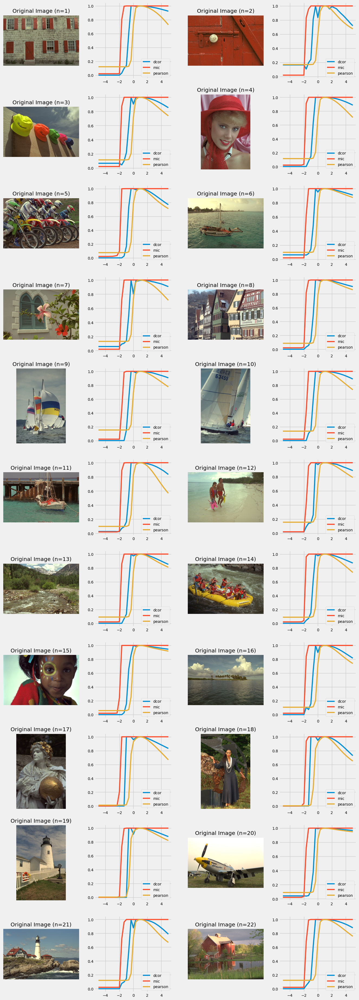

In [31]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(11, 4, figsize=(15, 45))
j = 0

for n_im in range(1, 23, 2):

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../../boxcox/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()

    n_im += 1

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../../boxcox/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 2].imshow(img)
    ax[j, 2].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 2].grid(False)
    ax[j, 2].set_xticks([])
    ax[j, 2].set_yticks([])


    ax[j, 3].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 3].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 3].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 3].set_xlabel('lambda')
    # ax[j, 3].set_ylabel('correlation')
    # ax[j, 3].set_title('Full Comparison')
    ax[j, 3].legend()

    j += 1

plt.savefig('full_comp.png')
plt.show()


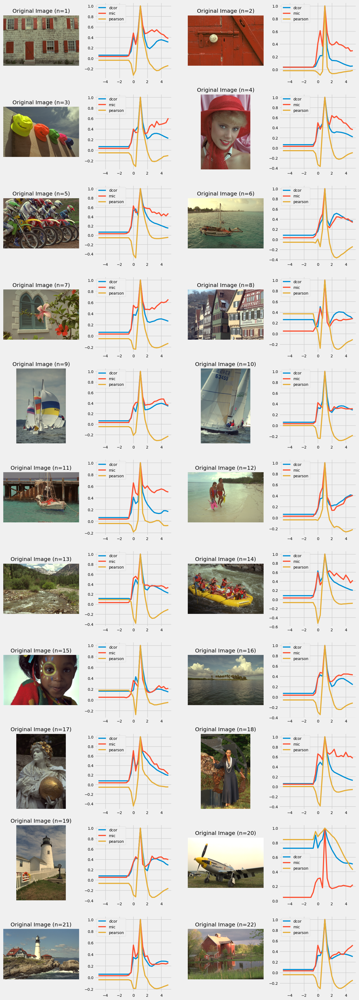

In [32]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(11, 4, figsize=(15, 45))
j = 0

for n_im in range(1, 23, 2):

    df_im = images_df_hist[images_df_hist['n_image'] == n_im]
    
    img_path = f'../../boxcox/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()

    n_im += 1

    df_im = images_df_hist[images_df_hist['n_image'] == n_im]
    
    img_path = f'../../boxcox/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 2].imshow(img)
    ax[j, 2].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 2].grid(False)
    ax[j, 2].set_xticks([])
    ax[j, 2].set_yticks([])


    ax[j, 3].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 3].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 3].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 3].set_xlabel('lambda')
    # ax[j, 3].set_ylabel('correlation')
    # ax[j, 3].set_title('Full Comparison')
    ax[j, 3].legend()

    j += 1

plt.savefig('hist_comp.png')
plt.show()


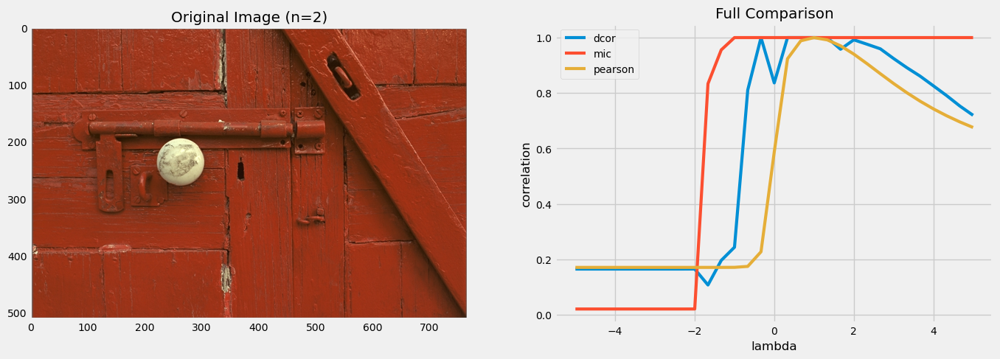

In [8]:
# plot lambda vs dcor, mic, pearson in df

n_im = 2

df_im = images_df_full[images_df_full['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



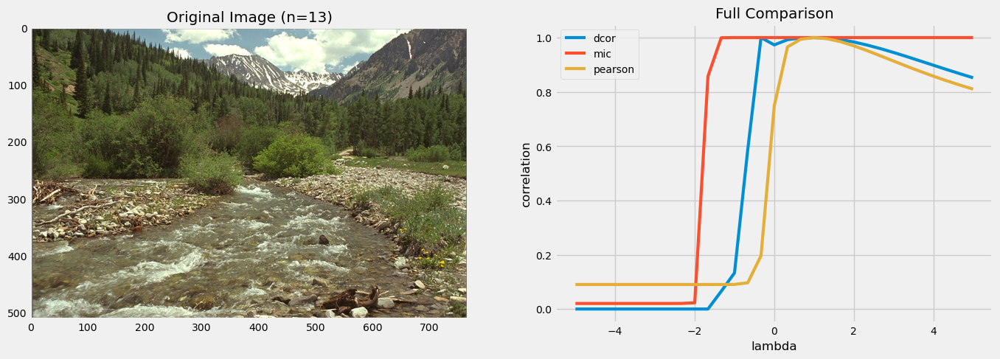

In [9]:
# plot lambda vs dcor, mic, pearson in df

n_im = 13

df_im = images_df_full[images_df_full['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



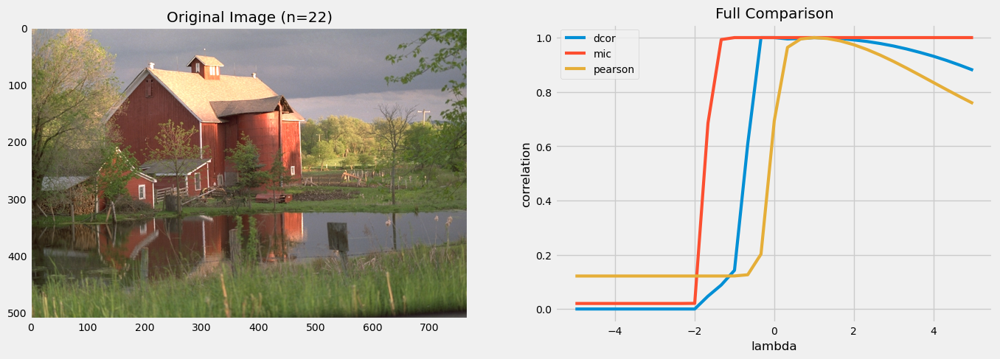

In [10]:
# plot lambda vs dcor, mic, pearson in df

n_im = 22

df_im = images_df_full[images_df_full['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



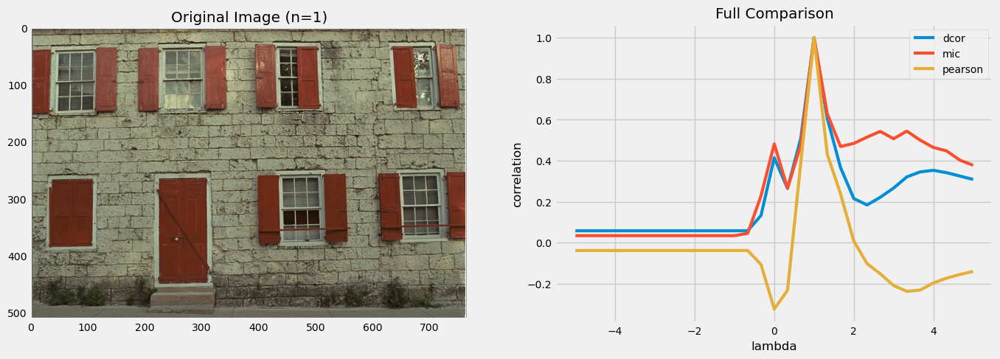

In [11]:
# plot lambda vs dcor, mic, pearson in df

n_im = 1

df_im = images_df_hist[images_df_hist['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



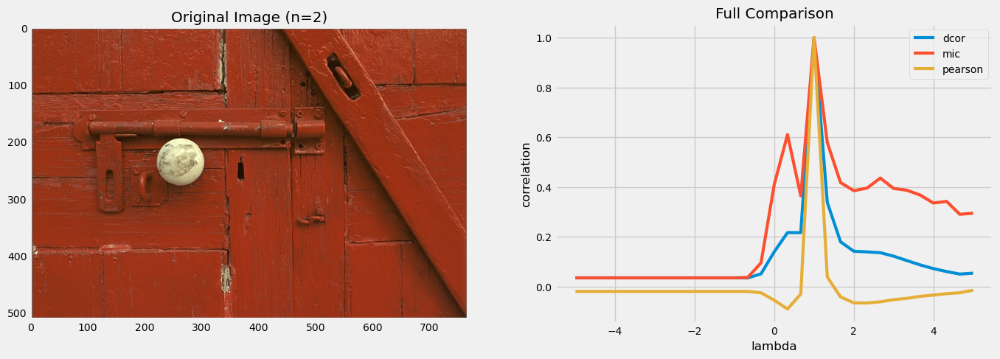

In [12]:
# plot lambda vs dcor, mic, pearson in df

n_im = 2

df_im = images_df_hist[images_df_hist['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



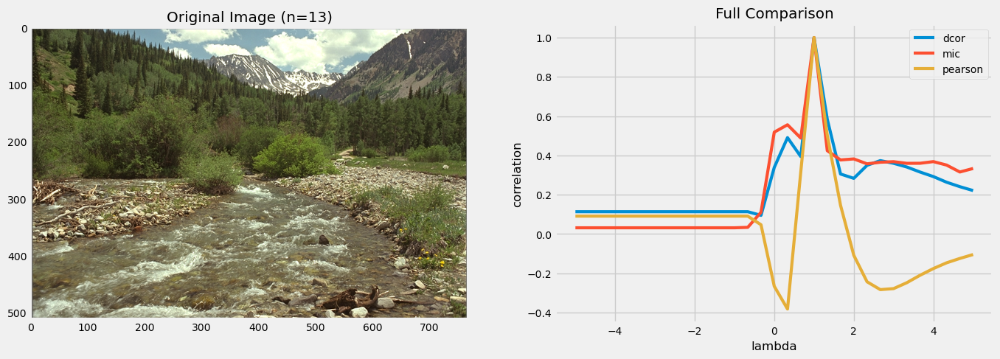

In [13]:
# plot lambda vs dcor, mic, pearson in df

n_im = 13

df_im = images_df_hist[images_df_hist['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()



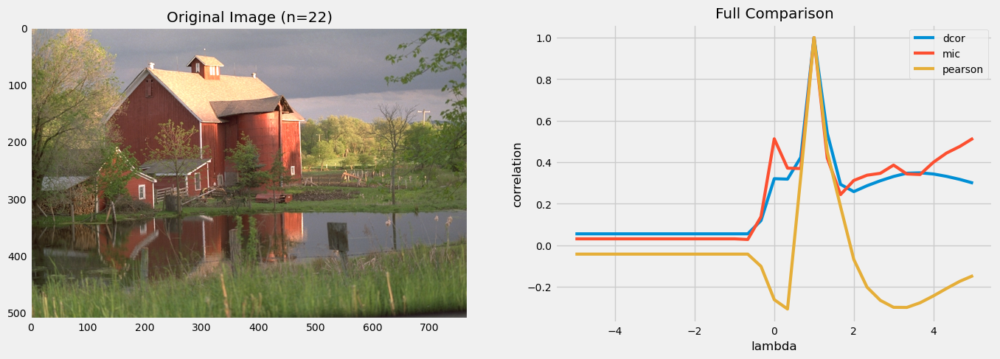

In [14]:
# plot lambda vs dcor, mic, pearson in df

n_im = 22

df_im = images_df_hist[images_df_hist['n_image'] == n_im]

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

img_path = f'../../boxcox/img/{n_im}.png'
img = plt.imread(img_path)
ax[0].imshow(img)
ax[0].set_title(f'Original Image (n={n_im})')
#remove grid
ax[0].grid(False)

ax[1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
ax[1].plot(df_im['lambda'], df_im['mic'], label='mic')
ax[1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
ax[1].set_xlabel('lambda')
ax[1].set_ylabel('correlation')
ax[1].set_title(f'Full Comparison')
ax[1].legend()
plt.show()

